In [2]:
import pandas as pd
import plotly.graph_objects as go
import gdown
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import plotly.express as px
from prophet import Prophet
import tensorflow as tf

In [ ]:
# ID del archivo de Google Drive
#file_id = '1a5vXnlVYJtP8fvb6VxcPFZ2uCZy1QJef'
# Construir el enlace de descarga
#url = f'https://drive.google.com/uc?export=download&id={file_id}'


In [3]:
# Ruta local donde se guardará el archivo descargado
output = 'archivo.csv'

In [ ]:
# Descargar el archivo
#gdown.download(url, output, quiet=False)

In [4]:
# Leer el archivo CSV
df = pd.read_csv(output)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3545049 entries, 0 to 3545048
Data columns (total 13 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   date                          object 
 1   timestamp                     int64  
 2   open                          float64
 3   high                          float64
 4   low                           float64
 5   close                         float64
 6   volume                        float64
 7   close_time                    int64  
 8   quote_asset_volume            float64
 9   number_of_trades              int64  
 10  taker_buy_base_asset_volume   float64
 11  taker_buy_quote_asset_volume  float64
 12  ignore                        int64  
dtypes: float64(8), int64(4), object(1)
memory usage: 351.6+ MB


In [ ]:
df.isnull().sum()

date                            0
timestamp                       0
open                            0
high                            0
low                             0
close                           0
volume                          0
close_time                      0
quote_asset_volume              0
number_of_trades                0
taker_buy_base_asset_volume     0
taker_buy_quote_asset_volume    0
ignore                          0
dtype: int64

In [5]:
df["date"] = pd.to_datetime(df["date"])

In [6]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
df.isnull().sum()

date                            0
timestamp                       0
open                            0
high                            0
low                             0
close                           0
volume                          0
close_time                      0
quote_asset_volume              0
number_of_trades                0
taker_buy_base_asset_volume     0
taker_buy_quote_asset_volume    0
ignore                          0
dtype: int64

In [ ]:
df.describe()

,date,timestamp,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
count,3545049,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000,3545049.000
mean,2021-01-03 15:34:03.940782848,1609688043940.769,22982.135,22995.158,22968.979,22982.139,49.831,1609688103939.627,1167295.541,1016.849,24.785,578618.839,0.000
min,2017-08-17 04:00:00,1502942400000.000,2830.000,2830.000,2817.000,2817.000,0.000,1502942459999.000,0.000,0.000,0.000,0.000,0.000
25%,2019-04-28 00:23:00,1556410980000.000,8143.660,8148.970,8138.310,8143.550,10.655,1556411039999.000,126369.466,172.000,4.788,55687.115,0.000
50%,2021-01-04 08:03:00,1609747380000.000,17081.330,17092.310,17069.860,17081.210,22.549,1609747439999.000,413213.524,453.000,10.852,192064.734,0.000
75%,2022-09-12 11:38:00,1662982680000.000,35783.610,35815.000,35751.300,35784.000,50.229,1662982739999.000,1292501.617,1050.000,25.110,631569.128,0.000
max,2024-05-20 00:00:00,1716163200000.000,73775.550,73777.000,73682.610,73775.540,5877.775,1716163259999.000,145955668.333,107315.000,3537.453,89475505.033,0.000
std,NaN,61535516626.116,17787.754,17797.299,17778.197,17787.777,93.419,61535516626.272,2314364.168,1765.265,47.589,1187849.860,0.000


In [ ]:
filter_date_start = '2017-08-17 04:00:00'
filter_date_end = '2017-09-01 04:00:00'
filtered_data = df.loc[(df['date'] >= filter_date_start) & (df['date'] <= filter_date_end)]

In [ ]:
def plot_chart(dataframe,title):
    fig = go.Figure(data=[go.Candlestick(x=dataframe['date'],
                                         open=dataframe['open'],
                                         high=dataframe['high'],
                                         low=dataframe['low'],
                                         close=dataframe['close'])])
    fig.update_layout(title=title,
                      xaxis_title='Date',
                      yaxis_title='Price (USDT)',
                      xaxis_rangeslider_visible=False)
    return fig

In [8]:
df.set_index('date', inplace=True)

hourly_data = df.resample('h').agg({
    'open': 'first',
    'high': 'max',
    'low': 'min',
    'close': 'last',
    'volume': 'sum',
    'number_of_trades': 'sum'
})

hourly_data.reset_index(inplace=True)
df.reset_index(inplace=True)



In [9]:
df.set_index('date', inplace=True)

daily_data = df.resample('d').agg({
    'open': 'first',
    'high': 'max',
    'low': 'min',
    'close': 'last',
    'volume': 'sum',
    'number_of_trades': 'sum'
})

daily_data.reset_index(inplace=True)
df.reset_index(inplace=True)

In [ ]:
plot_chart(filtered_data,'BTC/USDT Minute-by-Minute Prices').show()

c:\Users\germa\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [ ]:
plot_chart(hourly_data,'BTC/USDT Hourly Prices').show()

c:\Users\germa\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



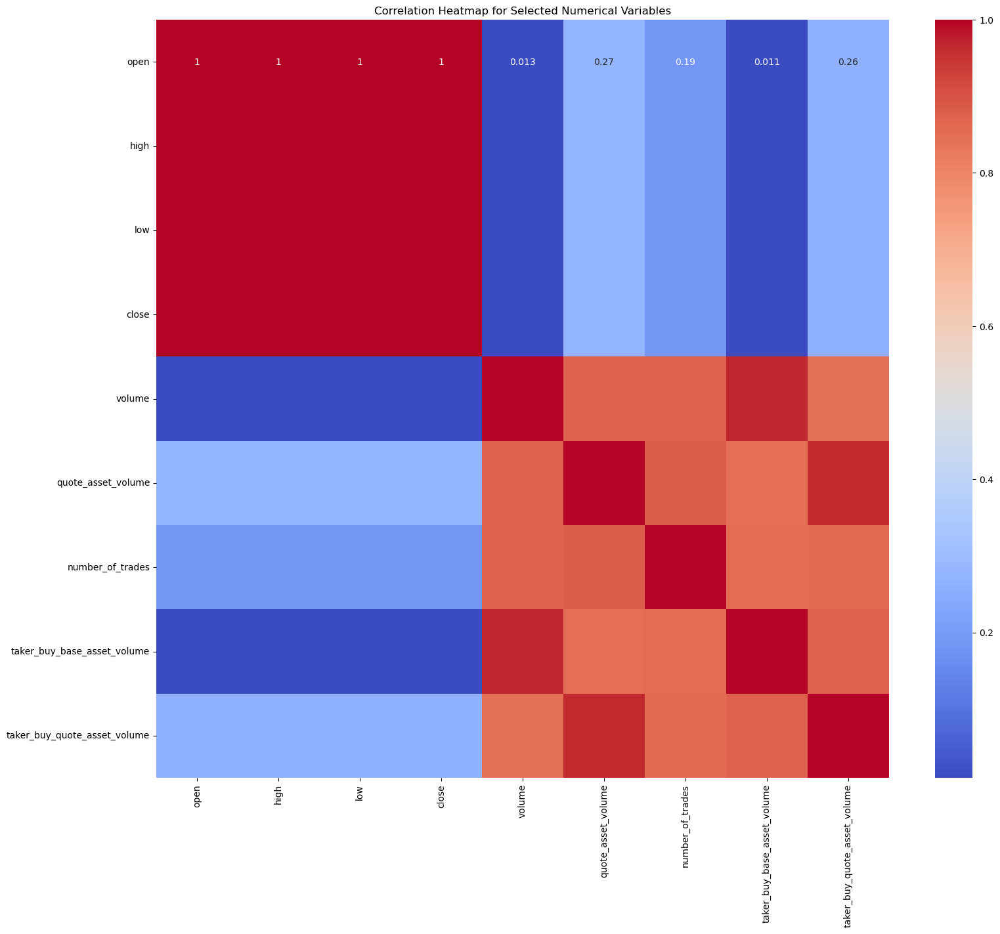

In [ ]:
# Setting up the matplotlib figure with an appropriate size
plt.figure(figsize=(18, 15))

# Drawing the heatmap for the numerical columns
sns.heatmap(df[["open", "high", "low", "close", "volume", "quote_asset_volume", "number_of_trades", "taker_buy_base_asset_volume", "taker_buy_quote_asset_volume"]].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap for Selected Numerical Variables")
plt.show()

In [ ]:
i = 1

In [10]:
for i in range(1,11):
    df[f"{i}_day_before"]= df['close'].rolling(window=1440 * i).mean().shift(1)

In [11]:
for i in range(1,13):
    df[f"{i}_month_before"] = df['close'].rolling(window=43800 * i).mean().shift(1)

In [12]:
df = df.dropna().reset_index(drop=True)

In [ ]:
df

,date,timestamp,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,...,3_month_before,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before
0,2018-08-19 20:51:00,1534711860000,6434.800,6445.000,6421.070,6444.990,125.882,1534711919999,809784.261,384,...,6992.500,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424
1,2018-08-19 20:52:00,1534711920000,6444.990,6470.000,6444.990,6460.990,213.463,1534711979999,1378359.797,786,...,6992.486,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428
2,2018-08-19 20:53:00,1534711980000,6460.990,6498.850,6460.990,6497.000,174.617,1534712039999,1132337.159,950,...,6992.473,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433
3,2018-08-19 20:54:00,1534712040000,6497.000,6499.000,6465.310,6481.950,97.377,1534712099999,631250.303,638,...,6992.459,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437
4,2018-08-19 20:55:00,1534712100000,6481.950,6519.000,6480.100,6517.790,241.475,1534712159999,1571573.169,1043,...,6992.445,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3019444,2024-05-19 23:56:00,1716162960000,66319.290,66319.290,66312.400,66312.400,2.107,1716163019999,139734.910,224,...,64321.062,59386.859,56229.523,53569.685,50876.811,47922.631,45506.281,43865.542,42635.124,41298.382
3019445,2024-05-19 23:57:00,1716163020000,66312.400,66312.410,66291.200,66291.210,2.368,1716163079999,157010.807,206,...,64321.172,59387.002,56229.632,53569.799,50876.934,47922.742,45506.383,43865.626,42635.206,41298.457
3019446,2024-05-19 23:58:00,1716163080000,66291.200,66291.210,66278.250,66287.990,11.718,1716163139999,776726.406,351,...,64321.282,59387.144,56229.741,53569.912,50877.057,47922.853,45506.485,43865.709,42635.288,41298.531
3019447,2024-05-19 23:59:00,1716163140000,66287.990,66288.000,66274.000,66274.010,6.159,1716163199999,408203.011,322,...,64321.392,59387.287,56229.849,53570.026,50877.180,47922.964,45506.587,43865.792,42635.370,41298.606


In [ ]:
df_corr = df.drop(columns=["date", "timestamp", "close_time", "ignore"])

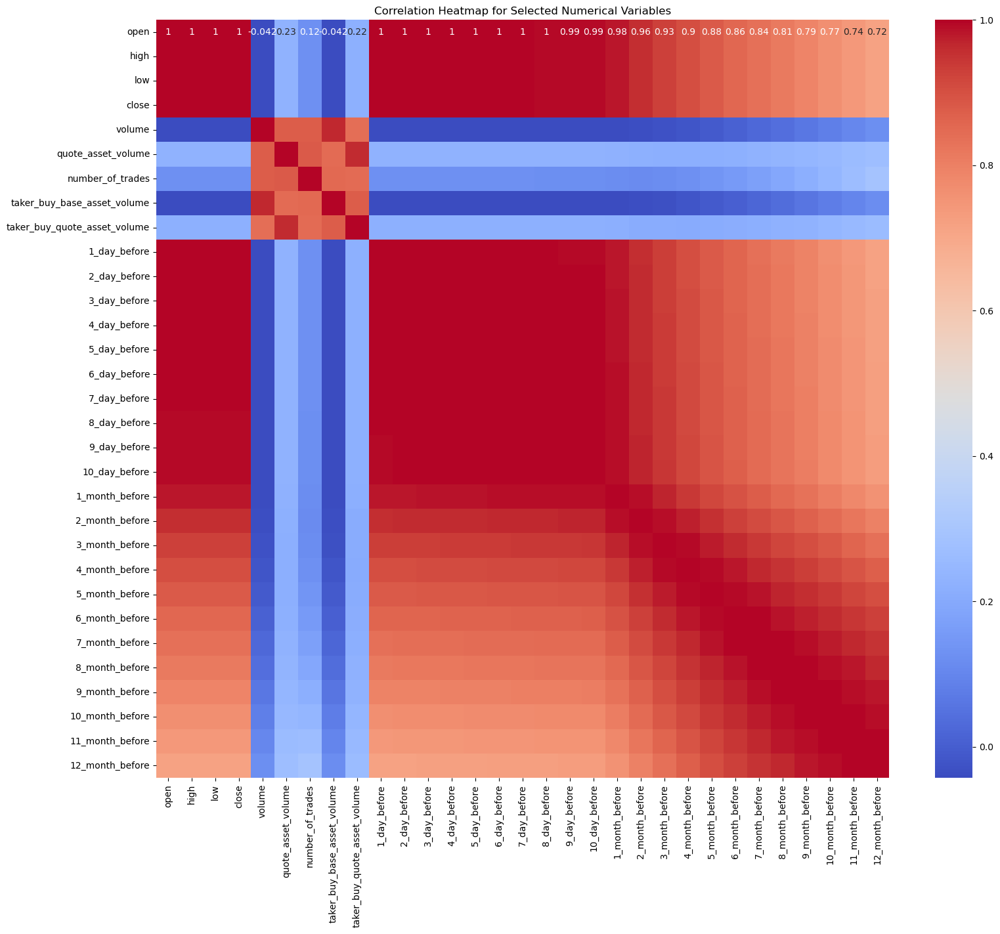

In [ ]:
# Setting up the matplotlib figure with an appropriate size
plt.figure(figsize=(18, 15))

# Drawing the heatmap for the numerical columns
sns.heatmap(df_corr.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap for Selected Numerical Variables")
plt.show()

In [ ]:
df.columns

Index(['date', 'timestamp', 'open', 'high', 'low', 'close', 'volume',
       'close_time', 'quote_asset_volume', 'number_of_trades',
       'taker_buy_base_asset_volume', 'taker_buy_quote_asset_volume', 'ignore',
       '1_day_before', '2_day_before', '3_day_before', '4_day_before',
       '5_day_before', '6_day_before', '7_day_before', '8_day_before',
       '9_day_before', '10_day_before', '1_month_before', '2_month_before',
       '3_month_before', '4_month_before', '5_month_before', '6_month_before',
       '7_month_before', '8_month_before', '9_month_before', '10_month_before',
       '11_month_before', '12_month_before'],
      dtype='object')

In [ ]:
pca = PCA(n_components=0.8)
principal_components = pca.fit_transform(df[['1_day_before', '2_day_before', '3_day_before', '4_day_before',
       '5_day_before', '6_day_before', '7_day_before', '8_day_before',
       '9_day_before']])

In [ ]:
principal_components

array([[-57318.89415196],
       [-57318.8227584 ],
       [-57318.74040219],
       ...,
       [120612.69544966],
       [120613.35032934],
       [120614.00069289]])

In [ ]:
df['last_days_pca'] = principal_components

In [ ]:
df

,date,timestamp,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,...,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before,last_days_pca
0,2018-08-19 20:51:00,1534711860000,6434.800,6445.000,6421.070,6444.990,125.882,1534711919999,809784.261,384,...,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424,-57318.894
1,2018-08-19 20:52:00,1534711920000,6444.990,6470.000,6444.990,6460.990,213.463,1534711979999,1378359.797,786,...,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428,-57318.823
2,2018-08-19 20:53:00,1534711980000,6460.990,6498.850,6460.990,6497.000,174.617,1534712039999,1132337.159,950,...,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433,-57318.740
3,2018-08-19 20:54:00,1534712040000,6497.000,6499.000,6465.310,6481.950,97.377,1534712099999,631250.303,638,...,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437,-57318.637
4,2018-08-19 20:55:00,1534712100000,6481.950,6519.000,6480.100,6517.790,241.475,1534712159999,1571573.169,1043,...,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441,-57318.540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3019444,2024-05-19 23:56:00,1716162960000,66319.290,66319.290,66312.400,66312.400,2.107,1716163019999,139734.910,224,...,59386.859,56229.523,53569.685,50876.811,47922.631,45506.281,43865.542,42635.124,41298.382,120611.346
3019445,2024-05-19 23:57:00,1716163020000,66312.400,66312.410,66291.200,66291.210,2.368,1716163079999,157010.807,206,...,59387.002,56229.632,53569.799,50876.934,47922.742,45506.383,43865.626,42635.206,41298.457,120612.026
3019446,2024-05-19 23:58:00,1716163080000,66291.200,66291.210,66278.250,66287.990,11.718,1716163139999,776726.406,351,...,59387.144,56229.741,53569.912,50877.057,47922.853,45506.485,43865.709,42635.288,41298.531,120612.695
3019447,2024-05-19 23:59:00,1716163140000,66287.990,66288.000,66274.000,66274.010,6.159,1716163199999,408203.011,322,...,59387.287,56229.849,53570.026,50877.180,47922.964,45506.587,43865.792,42635.370,41298.606,120613.350


In [ ]:
df = df.drop(columns=['1_day_before', '2_day_before', '3_day_before', '4_day_before',
       '5_day_before', '6_day_before', '7_day_before', '8_day_before',
       '9_day_before', '10_day_before'])

In [ ]:
df_corr = df.drop(columns=["date", "timestamp", "close_time", "ignore"])

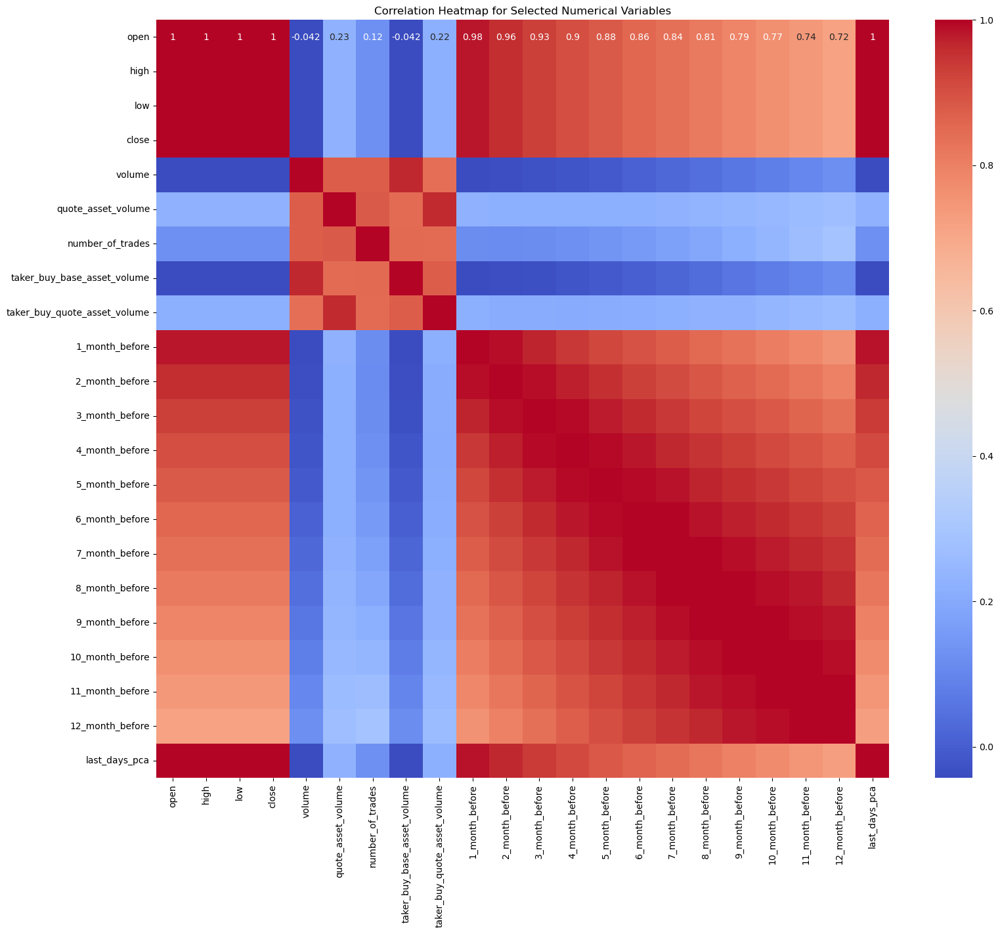

In [ ]:
# Setting up the matplotlib figure with an appropriate size
plt.figure(figsize=(18, 15))

# Drawing the heatmap for the numerical columns
sns.heatmap(df_corr.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap for Selected Numerical Variables")
plt.show()

In [ ]:
filter_date_end = '2024-03-20 00:00:00'


In [ ]:
df_train = df.loc[(df['date'] <= filter_date_end)]
df_test = df.loc[(df['date'] > filter_date_end)]

In [ ]:
df_train

,date,timestamp,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,...,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before,last_days_pca
0,2018-08-19 20:51:00,1534711860000,6434.800,6445.000,6421.070,6444.990,125.882,1534711919999,809784.261,384,...,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424,-57318.894
1,2018-08-19 20:52:00,1534711920000,6444.990,6470.000,6444.990,6460.990,213.463,1534711979999,1378359.797,786,...,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428,-57318.823
2,2018-08-19 20:53:00,1534711980000,6460.990,6498.850,6460.990,6497.000,174.617,1534712039999,1132337.159,950,...,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433,-57318.740
3,2018-08-19 20:54:00,1534712040000,6497.000,6499.000,6465.310,6481.950,97.377,1534712099999,631250.303,638,...,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437,-57318.637
4,2018-08-19 20:55:00,1534712100000,6481.950,6519.000,6480.100,6517.790,241.475,1534712159999,1571573.169,1043,...,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441,-57318.540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2931604,2024-03-19 23:56:00,1710892560000,61826.490,61942.200,61820.010,61908.930,78.958,1710892619999,4884947.779,1761,...,47638.836,45046.302,42077.797,39805.198,38469.401,37563.330,36466.557,35693.462,35104.178,125541.573
2931605,2024-03-19 23:57:00,1710892620000,61908.920,61948.000,61843.710,61873.860,46.962,1710892679999,2906310.367,1290,...,47638.980,45046.454,42077.929,39805.315,38469.492,37563.419,36466.637,35693.531,35104.242,125537.090
2931606,2024-03-19 23:58:00,1710892680000,61873.850,61978.990,61860.000,61969.050,26.958,1710892739999,1668858.163,1068,...,47639.125,45046.606,42078.060,39805.432,38469.584,37563.508,36466.717,35693.599,35104.307,125532.622
2931607,2024-03-19 23:59:00,1710892740000,61969.040,62057.710,61937.400,61937.400,35.831,1710892799999,2221898.603,1356,...,47639.269,45046.758,42078.193,39805.549,38469.675,37563.597,36466.796,35693.668,35104.372,125528.236


In [ ]:
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
knn = KNeighborsRegressor(n_neighbors=10)

In [ ]:
X_df_train = df_train.drop(columns=["open", "high", "low", "close", "ignore", "date", "timestamp", "close_time"])
y_train = df_train["close"]

In [ ]:
knn.fit( X_df_train, y_train)

KNeighborsRegressor(n_neighbors=10)

In [ ]:
X_df_test = df_test.drop(columns=["open", "high", "low","close", "ignore", "date", "timestamp", "close_time"])

In [ ]:
y_df_test = df_test["close"]

In [ ]:
X_df_test = np.array(X_df_test.iloc[0]).reshape(1,-1)
predict = knn.predict(X_df_test)
for i in range(1,30):
    new_row = X_df_train.iloc[-1].copy()
    new_row["volume"] = X_df_train['volume'].rolling(window=30).mean().tail(1).values
    new_row["quote_asset_volume"] = X_df_train['quote_asset_volume'].rolling(window=30).mean().tail(1).values
    new_row["number_of_trades"] = X_df_train['number_of_trades'].rolling(window=30).mean().tail(1).values
    new_row["taker_buy_base_asset_volume"] = X_df_train['taker_buy_base_asset_volume'].rolling(window=30).mean().tail(1).values
    new_row["taker_buy_quote_asset_volume"] = X_df_train['taker_buy_quote_asset_volume'].rolling(window=30).mean().tail(1).values
    X_df_train = pd.concat([X_df_train, new_row.to_frame().T], ignore_index=True)
    y_train = pd.concat([y_train,pd.Series(predict)], ignore_index=True)
    ABT_temp = pd.concat([X_df_train,y_train], axis=1).rename(columns={0:"close"})
    for i in range(1,13):
        ABT_temp.iloc[-1][f"{i}_month_before"] = ABT_temp['close'].rolling(window=43800 * i).mean().shift(1).tail(1).values

    X_df_train = ABT_temp.drop(columns=["close"])
    y_train = ABT_temp["close"]
    X_df_test = np.array(X_df_train.iloc[-1]).reshape(1,-1)
    predict = knn.predict(X_df_test)

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted with feature names

c:\Users\germa\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KNeighborsRegressor was fitted 

In [ ]:
ABT_temp["close"].tail(29)

2931609   59984.258
2931610   65695.310
2931611   68135.106
2931612   67062.507
2931613   65481.831
2931614   67449.413
2931615   69132.674
2931616   68500.461
2931617   65522.263
2931618   65275.782
2931619   65633.658
2931620   66366.172
2931621   65759.318
2931622   65697.838
2931623   66998.564
2931624   65444.420
2931625   64352.496
2931626   65434.515
2931627   67437.836
2931628   66981.797
2931629   65084.270
2931630   66076.216
2931631   67916.872
2931632   67716.855
2931633   66222.068
2931634   67397.351
2931635   67955.639
2931636   66976.916
2931637   68168.054
Name: close, dtype: float64

In [ ]:
y_df_test.head(29)

2931609   62159.380
2931610   62190.650
2931611   62070.520
2931612   61961.400
2931613   62180.880
2931614   61981.100
2931615   61989.940
2931616   62134.930
2931617   62150.070
2931618   62184.000
2931619   62140.000
2931620   62211.220
2931621   62069.180
2931622   62128.090
2931623   62104.000
2931624   62015.900
2931625   62196.250
2931626   62441.100
2931627   62570.840
2931628   62621.090
2931629   62585.000
2931630   62639.980
2931631   62641.110
2931632   62790.170
2931633   62936.270
2931634   62979.990
2931635   62793.000
2931636   62848.610
2931637   62773.220
Name: close, dtype: float64

In [ ]:
print("MAE", mean_absolute_error(ABT_temp["close"].tail(29), y_df_test.head(29)))
print("RMSE", mean_squared_error(ABT_temp["close"].tail(29), y_df_test.head(29), squared=False))
print("R2 score", r2_score(ABT_temp["close"].tail(29), y_df_test.head(29)))

MAE 4197.338413793104
RMSE 4371.562837275546
R2 score -5.673717014484679


In [ ]:
ABT_temp = pd.concat([ABT_temp.rename(columns={"close": "real"}), y_df_test.head(29)], axis=1)

In [ ]:
ABT_temp

,volume,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,1_month_before,2_month_before,3_month_before,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before,last_days_pca,real,close
0,125.882,809784.261,384.000,105.414,678218.072,7153.431,6820.823,6992.500,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424,-57318.894,6444.990,NaN
1,213.463,1378359.797,786.000,189.459,1223358.997,7153.408,6820.820,6992.486,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428,-57318.823,6460.990,NaN
2,174.617,1132337.159,950.000,141.823,919737.756,7153.385,6820.818,6992.473,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433,-57318.740,6497.000,NaN
3,97.377,631250.303,638.000,47.463,307815.354,7153.363,6820.815,6992.459,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437,-57318.637,6481.950,NaN
4,241.475,1571573.169,1043.000,207.918,1353073.645,7153.341,6820.813,6992.445,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441,-57318.540,6517.790,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2931633,52.798,3273693.598,1706.618,23.565,1461382.969,62192.951,53363.222,50110.470,47643.610,45051.181,42082.018,39808.926,38472.352,37566.175,36469.101,35695.667,35106.247,125523.819,66222.068,62936.270
2931634,51.729,3207780.542,1676.439,23.654,1466955.188,62193.283,53363.508,50110.654,47643.778,45051.352,42082.166,39809.057,38472.456,37566.275,36469.191,35695.744,35106.320,125523.819,67397.351,62979.990
2931635,50.821,3151874.967,1673.620,23.258,1442588.405,62193.641,53363.807,50110.847,47643.954,45051.529,42082.319,39809.192,38472.563,37566.378,36469.283,35695.824,35106.395,125523.819,67955.639,62793.000
2931636,50.950,3160060.454,1686.408,23.300,1445284.199,62194.013,53364.113,50111.044,47644.132,45051.708,42082.473,39809.328,38472.672,37566.483,36469.376,35695.906,35106.471,125523.819,66976.916,62848.610


In [ ]:
ABT_temp["temp"] = ABT_temp["close"]
ABT_temp.loc[2931609:2931638, "close"] = ABT_temp.loc[2931609:2931638]["real"]
ABT_temp.loc[2931609:2931638, "real"] = ABT_temp.loc[2931609:2931638]["temp"] 
ABT_temp = ABT_temp.drop(columns="temp")

In [ ]:
ABT_temp

,volume,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,1_month_before,2_month_before,3_month_before,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before,last_days_pca,real,close
0,125.882,809784.261,384.000,105.414,678218.072,7153.431,6820.823,6992.500,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424,-57318.894,6444.990,NaN
1,213.463,1378359.797,786.000,189.459,1223358.997,7153.408,6820.820,6992.486,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428,-57318.823,6460.990,NaN
2,174.617,1132337.159,950.000,141.823,919737.756,7153.385,6820.818,6992.473,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433,-57318.740,6497.000,NaN
3,97.377,631250.303,638.000,47.463,307815.354,7153.363,6820.815,6992.459,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437,-57318.637,6481.950,NaN
4,241.475,1571573.169,1043.000,207.918,1353073.645,7153.341,6820.813,6992.445,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441,-57318.540,6517.790,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2931633,52.798,3273693.598,1706.618,23.565,1461382.969,62192.951,53363.222,50110.470,47643.610,45051.181,42082.018,39808.926,38472.352,37566.175,36469.101,35695.667,35106.247,125523.819,62936.270,66222.068
2931634,51.729,3207780.542,1676.439,23.654,1466955.188,62193.283,53363.508,50110.654,47643.778,45051.352,42082.166,39809.057,38472.456,37566.275,36469.191,35695.744,35106.320,125523.819,62979.990,67397.351
2931635,50.821,3151874.967,1673.620,23.258,1442588.405,62193.641,53363.807,50110.847,47643.954,45051.529,42082.319,39809.192,38472.563,37566.378,36469.283,35695.824,35106.395,125523.819,62793.000,67955.639
2931636,50.950,3160060.454,1686.408,23.300,1445284.199,62194.013,53364.113,50111.044,47644.132,45051.708,42082.473,39809.328,38472.672,37566.483,36469.376,35695.906,35106.471,125523.819,62848.610,66976.916


In [ ]:

fig = px.line(ABT_temp.tail(100), x=ABT_temp.tail(100).index, y=["close", "real"],
              title='custom tick labels with ticklabelmode="period"')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")
fig.show()

In [ ]:
daily_data

,date,open,high,low,close,volume,number_of_trades
0,2017-08-17,4261.480,4485.390,4200.740,4285.080,795.150,3427
1,2017-08-18,4285.080,4371.520,3938.770,4108.370,1199.888,5233
2,2017-08-19,4108.370,4184.690,3850.000,4139.980,381.310,2153
3,2017-08-20,4139.980,4211.080,4032.620,4086.290,467.083,2321
4,2017-08-21,4069.130,4119.620,3911.790,4016.000,691.743,3972
...,...,...,...,...,...,...,...
2464,2024-05-16,66206.510,66752.010,64602.770,65235.210,31106.367,1269793
2465,2024-05-17,65235.210,67451.200,65106.380,67024.000,26292.234,1117254
2466,2024-05-18,67024.000,67400.010,66600.000,66915.200,14441.258,734067
2467,2024-05-19,66915.200,67700.000,65857.250,66274.010,18025.304,823729


In [ ]:
for i in range(1,11):
    daily_data[f"{i}_day_before"]= daily_data['close'].shift(i)

In [ ]:
for i in range(1,13):
    daily_data[f"{i}_month_before"] = daily_data['close'].rolling(window=30 * i).mean().shift(1)

In [ ]:
daily_data = daily_data.dropna().reset_index(drop=True)

In [ ]:
df

,date,timestamp,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,...,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before,last_days_pca
0,2018-08-19 20:51:00,1534711860000,6434.800,6445.000,6421.070,6444.990,125.882,1534711919999,809784.261,384,...,7484.683,7519.122,7914.876,8204.900,9026.842,9314.121,9019.826,8599.187,8235.424,-57318.894
1,2018-08-19 20:52:00,1534711920000,6444.990,6470.000,6444.990,6460.990,213.463,1534711979999,1378359.797,786,...,7484.673,7519.112,7914.860,8204.884,9026.806,9314.118,9019.828,8599.193,8235.428,-57318.823
2,2018-08-19 20:53:00,1534711980000,6460.990,6498.850,6460.990,6497.000,174.617,1534712039999,1132337.159,950,...,7484.663,7519.103,7914.844,8204.867,9026.770,9314.116,9019.830,8599.199,8235.433,-57318.740
3,2018-08-19 20:54:00,1534712040000,6497.000,6499.000,6465.310,6481.950,97.377,1534712099999,631250.303,638,...,7484.653,7519.093,7914.828,8204.851,9026.734,9314.114,9019.832,8599.205,8235.437,-57318.637
4,2018-08-19 20:55:00,1534712100000,6481.950,6519.000,6480.100,6517.790,241.475,1534712159999,1571573.169,1043,...,7484.643,7519.084,7914.812,8204.835,9026.698,9314.111,9019.834,8599.210,8235.441,-57318.540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3019444,2024-05-19 23:56:00,1716162960000,66319.290,66319.290,66312.400,66312.400,2.107,1716163019999,139734.910,224,...,59386.859,56229.523,53569.685,50876.811,47922.631,45506.281,43865.542,42635.124,41298.382,120611.346
3019445,2024-05-19 23:57:00,1716163020000,66312.400,66312.410,66291.200,66291.210,2.368,1716163079999,157010.807,206,...,59387.002,56229.632,53569.799,50876.934,47922.742,45506.383,43865.626,42635.206,41298.457,120612.026
3019446,2024-05-19 23:58:00,1716163080000,66291.200,66291.210,66278.250,66287.990,11.718,1716163139999,776726.406,351,...,59387.144,56229.741,53569.912,50877.057,47922.853,45506.485,43865.709,42635.288,41298.531,120612.695
3019447,2024-05-19 23:59:00,1716163140000,66287.990,66288.000,66274.000,66274.010,6.159,1716163199999,408203.011,322,...,59387.287,56229.849,53570.026,50877.180,47922.964,45506.587,43865.792,42635.370,41298.606,120613.350


In [ ]:
df_2 = df.drop(columns=["timestamp", "close_time", "ignore"])

In [ ]:
daily_data

,date,open,high,low,close,volume,number_of_trades,1_day_before,2_day_before,3_day_before,...,3_month_before,4_month_before,5_month_before,6_month_before,7_month_before,8_month_before,9_month_before,10_month_before,11_month_before,12_month_before
0,2018-08-12,6222.550,6472.300,6130.000,6308.330,38567.771,190399,6232.350,6144.010,6529.790,...,7119.771,7578.573,7596.319,8014.064,8324.583,9187.930,9401.158,9092.125,8661.576,8294.667
1,2018-08-13,6308.560,6545.000,6145.040,6246.350,53895.829,239602,6308.330,6232.350,6144.010,...,7093.604,7564.484,7583.435,8001.666,8290.456,9141.132,9397.707,9093.953,8669.435,8300.287
2,2018-08-14,6248.250,6250.330,5880.000,6188.080,50186.745,252004,6246.350,6308.330,6232.350,...,7068.986,7546.912,7570.010,7983.868,8255.725,9087.564,9391.714,9096.124,8677.151,8306.226
3,2018-08-15,6188.080,6609.000,6172.110,6267.160,68806.687,329413,6188.080,6246.350,6308.330,...,7045.187,7531.271,7559.099,7962.690,8233.287,9034.764,9386.117,9098.377,8683.676,8311.915
4,2018-08-16,6265.270,6480.000,6205.600,6311.750,48515.255,228942,6267.160,6188.080,6246.350,...,7025.472,7517.789,7546.280,7941.064,8210.803,8982.309,9380.581,9100.322,8690.818,8317.973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2104,2024-05-16,66206.510,66752.010,64602.770,65235.210,31106.367,1269793,66206.500,61577.490,62940.080,...,63977.270,58959.189,55893.532,53258.568,50591.197,47670.240,45282.330,43659.492,42451.775,41137.306
2105,2024-05-17,65235.210,67451.200,65106.380,67024.000,26292.234,1117254,65235.210,66206.500,61577.490,...,64122.949,59146.348,56044.049,53417.830,50765.109,47828.677,45426.942,43777.270,42558.567,41243.934
2106,2024-05-18,67024.000,67400.010,66600.000,66915.200,14441.258,734067,67024.000,65235.210,66206.500,...,64293.853,59360.485,56209.035,53582.631,50942.990,47994.923,45578.413,43901.370,42671.109,41354.502
2107,2024-05-19,66915.200,67700.000,65857.250,66274.010,18025.304,823729,66915.200,67024.000,65235.210,...,64458.048,59570.953,56364.010,53746.333,51119.206,48163.036,45729.743,44024.141,42780.887,41467.241


In [ ]:
hourly_data

,date,open,high,low,close,volume,number_of_trades
0,2017-08-17 04:00:00,4261.480,4313.620,4261.320,4308.830,47.181,171
1,2017-08-17 05:00:00,4308.830,4328.690,4291.370,4315.320,23.235,102
2,2017-08-17 06:00:00,4315.320,4345.450,4309.370,4324.350,7.230,36
3,2017-08-17 07:00:00,4324.350,4349.990,4287.410,4349.990,4.443,25
4,2017-08-17 08:00:00,4333.320,4377.850,4333.320,4360.690,0.973,28
...,...,...,...,...,...,...,...
59224,2024-05-19 20:00:00,66034.010,66300.000,66019.990,66163.990,650.749,28390
59225,2024-05-19 21:00:00,66164.000,66360.000,66000.000,66280.000,458.742,33901
59226,2024-05-19 22:00:00,66280.000,66463.000,66252.000,66363.610,508.042,25817
59227,2024-05-19 23:00:00,66363.610,66363.610,66211.870,66274.010,384.646,17388


In [13]:
hourly_data.isnull().sum()

date                  0
open                128
high                128
low                 128
close               128
volume                0
number_of_trades      0
dtype: int64

In [ ]:
data = {
    'ds': hourly_data["date"],
    'y': hourly_data["close"]
}
df_prophet = pd.DataFrame(data)

In [ ]:
df_prophet['month'] = df_prophet['ds'].dt.month

In [ ]:
df_prophet

,ds,y,month
0,2017-08-17 04:00:00,4308.830,8
1,2017-08-17 05:00:00,4315.320,8
2,2017-08-17 06:00:00,4324.350,8
3,2017-08-17 07:00:00,4349.990,8
4,2017-08-17 08:00:00,4360.690,8
...,...,...,...
59224,2024-05-19 20:00:00,66163.990,5
59225,2024-05-19 21:00:00,66280.000,5
59226,2024-05-19 22:00:00,66363.610,5
59227,2024-05-19 23:00:00,66274.010,5


In [ ]:
# Crear y entrenar el modelo
model = Prophet()
model.add_regressor('month')
model.fit(df_prophet)

14:00:12 - cmdstanpy - INFO - Chain [1] start processing
14:01:05 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:

# Crear un DataFrame con las fechas futuras
future = model.make_future_dataframe(periods=4380, freq='H')

future['month'] = future['ds'].dt.month

# Hacer las predicciones
forecast = model.predict(future)

In [ ]:
future

,ds,month
0,2017-08-17 04:00:00,8
1,2017-08-17 05:00:00,8
2,2017-08-17 06:00:00,8
3,2017-08-17 07:00:00,8
4,2017-08-17 08:00:00,8
...,...,...
63476,2024-11-18 08:00:00,11
63477,2024-11-18 09:00:00,11
63478,2024-11-18 10:00:00,11
63479,2024-11-18 11:00:00,11


c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



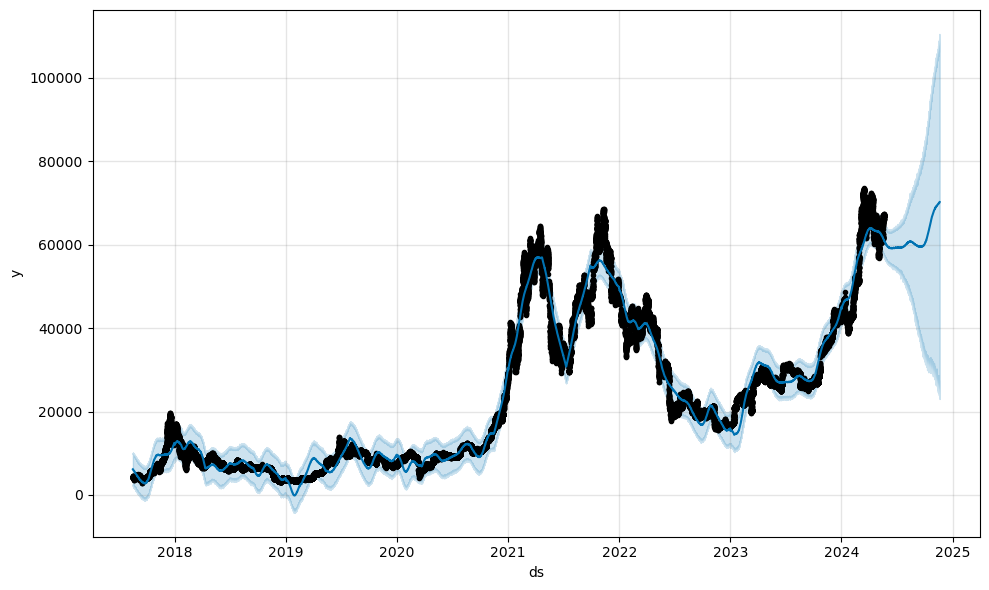

c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:397: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:401: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\germa\anaconda3\Lib\site-packages\prophet\plot.py:351: FutureWarning:


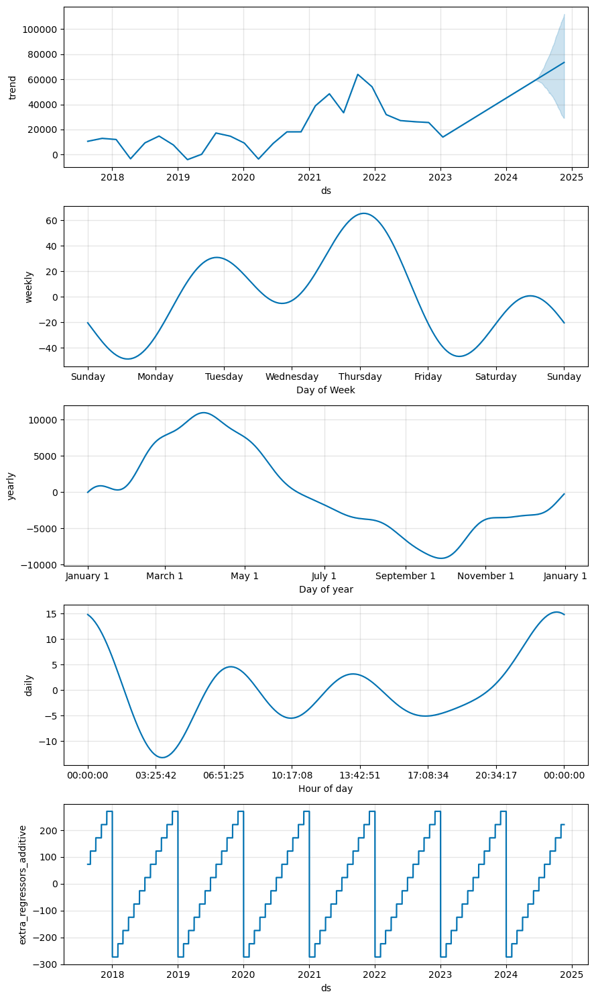

In [ ]:
# Graficar las predicciones
fig1 = model.plot(forecast)
plt.show()

# Graficar los componentes de la serie temporal
fig2 = model.plot_components(forecast)
plt.show()

In [20]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [14]:
# Cargar datos
datas = {
    'date': hourly_data["date"],
    'close': hourly_data["close"]
}
data = pd.DataFrame(datas)
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

In [15]:
data = data.ffill()

In [16]:
# Preprocesamiento de datos
# Supongamos que usamos los últimos 60 días para predecir el próximo día
window_size = 60
features = []
labels = []
for i in range(window_size, len(data)):
    features.append(data['close'][i-window_size:i])
    labels.append(data['close'][i])

C:\Users\germa\AppData\Local\Temp\ipykernel_33572\2933254951.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels.append(data['close'][i])


In [17]:
# Convertir a arrays de numpy para entrenamiento
features, labels = np.array(features), np.array(labels)

In [ ]:
"""
# Normalizar los datos
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(features)
features_scaled = scaler.transform(features)

# Dividir datos en entrenamiento y prueba
train_size = int(len(features) * 0.8)
test_size = len(features) - train_size
train_features, test_features = features_scaled[:train_size], features_scaled[train_size:]
train_labels, test_labels = labels[:train_size], labels[train_size:]

# Reshape features para el modelo LSTM (muestra, pasos de tiempo, características)
train_features = np.reshape(train_features, (train_features.shape[0], train_features.shape[1], 1))
test_features = np.reshape(test_features, (test_features.shape[0], test_features.shape[1], 1))
"""

'\n# Normalizar los datos\nfrom sklearn.preprocessing import MinMaxScaler\nscaler = MinMaxScaler(feature_range=(0,1))\nscaler.fit(features)\nfeatures_scaled = scaler.transform(features)\n\n# Dividir datos en entrenamiento y prueba\ntrain_size = int(len(features) * 0.8)\ntest_size = len(features) - train_size\ntrain_features, test_features = features_scaled[:train_size], features_scaled[train_size:]\ntrain_labels, test_labels = labels[:train_size], labels[train_size:]\n\n# Reshape features para el modelo LSTM (muestra, pasos de tiempo, características)\ntrain_features = np.reshape(train_features, (train_features.shape[0], train_features.shape[1], 1))\ntest_features = np.reshape(test_features, (test_features.shape[0], test_features.shape[1], 1))\n'

In [ ]:
from sklearn.preprocessing import MinMaxScaler
train_size = int(len(features) * 0.8)
test_size = len(features) - train_size
train_features = features[:train_size]
test_features = features[train_size:]
train_labels = labels[:train_size]
test_labels = labels[train_size:]
# Normalizar los datos
scaler = MinMaxScaler(feature_range=(0, 1))
train_features_scaled = scaler.fit_transform(train_features)  # Ajustar y transformar los datos de entrenamiento
test_features_scaled = scaler.transform(test_features)  # Transformar los datos de prueba con el scaler ajustado
# Reshape features para el modelo LSTM (muestras, pasos de tiempo, características)
train_features = np.reshape(train_features_scaled, (train_features_scaled.shape[0], train_features_scaled.shape[1], 1))
test_features = np.reshape(test_features_scaled, (test_features_scaled.shape[0], test_features_scaled.shape[1], 1))

In [ ]:
model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(window_size, 1)),
    Dropout(0.2),
    BatchNormalization(),
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    BatchNormalization(),
    LSTM(50),
    Dropout(0.2),
    BatchNormalization(),
    Dense(25, activation='relu'),
    Dense(1)
])

optimizer = Adam(learning_rate= 0.001)

# Compilar el modelo
model.compile(optimizer = optimizer, loss='mean_squared_error')

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)

history = model.fit(
    train_features, train_labels,
    epochs=100,
    batch_size=32,
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr],
    verbose=2
)

Epoch 1/100


c:\Users\germa\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



1332/1332 - 30s - 23ms/step - loss: 504232448.0000 - val_loss: 92163368.0000 - learning_rate: 0.0010
Epoch 2/100
1332/1332 - 26s - 19ms/step - loss: 29432346.0000 - val_loss: 342226.5000 - learning_rate: 0.0010
Epoch 3/100
1332/1332 - 26s - 19ms/step - loss: 9743000.0000 - val_loss: 753473.3750 - learning_rate: 0.0010
Epoch 4/100
1332/1332 - 26s - 19ms/step - loss: 7894329.0000 - val_loss: 405273.5000 - learning_rate: 0.0010
Epoch 5/100
1332/1332 - 24s - 18ms/step - loss: 7873538.5000 - val_loss: 256396.7344 - learning_rate: 0.0010
Epoch 6/100
1332/1332 - 24s - 18ms/step - loss: 5850701.0000 - val_loss: 144757.9844 - learning_rate: 0.0010
Epoch 7/100
1332/1332 - 24s - 18ms/step - loss: 5100135.5000 - val_loss: 461350.9375 - learning_rate: 0.0010
Epoch 8/100
1332/1332 - 25s - 18ms/step - loss: 4681190.0000 - val_loss: 1646924.6250 - learning_rate: 0.0010
Epoch 9/100
1332/1332 - 25s - 18ms/step - loss: 4744181.0000 - val_loss: 980010.3750 - learning_rate: 0.0010
Epoch 10/100
1332/1332 - 

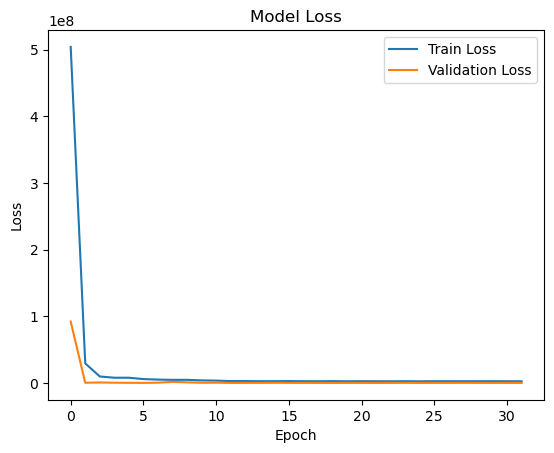

In [ ]:
# Visualizar la pérdida
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [ ]:
# Realizar predicciones
predicted_prices = model.predict(test_features)
predicted_prices

370/370 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


array([[18657.684],
       [18740.908],
       [18802.281],
       ...,
       [65966.266],
       [65934.805],
       [65919.766]], dtype=float32)

In [ ]:
predicted_prices = pd.DataFrame(data=predicted_prices, index=data[-len(predicted_prices):].index)

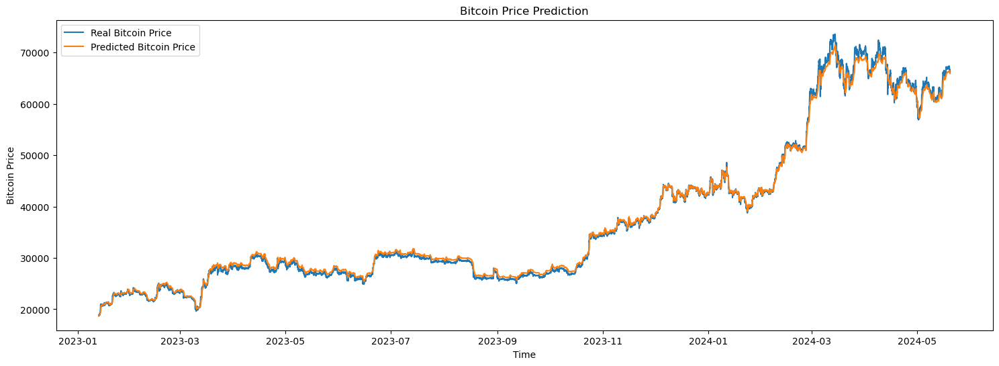

In [ ]:

# Visualizar los resultados
plt.figure(figsize=(18,6))
plt.plot(data['close'].iloc[train_size + window_size:], label='Real Bitcoin Price')
plt.plot(predicted_prices, label='Predicted Bitcoin Price')
plt.title('Bitcoin Price Prediction')
plt.xlabel('Time')
plt.ylabel('Bitcoin Price')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(test_labels, predicted_prices[0])
mae = mean_absolute_error(test_labels, predicted_prices[0])
r2 = r2_score(test_labels, predicted_prices[0])

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R² Score: {r2}")

Mean Squared Error: 422801.42530569824
Mean Absolute Error: 497.8273642021929
R² Score: 0.9980371153359856


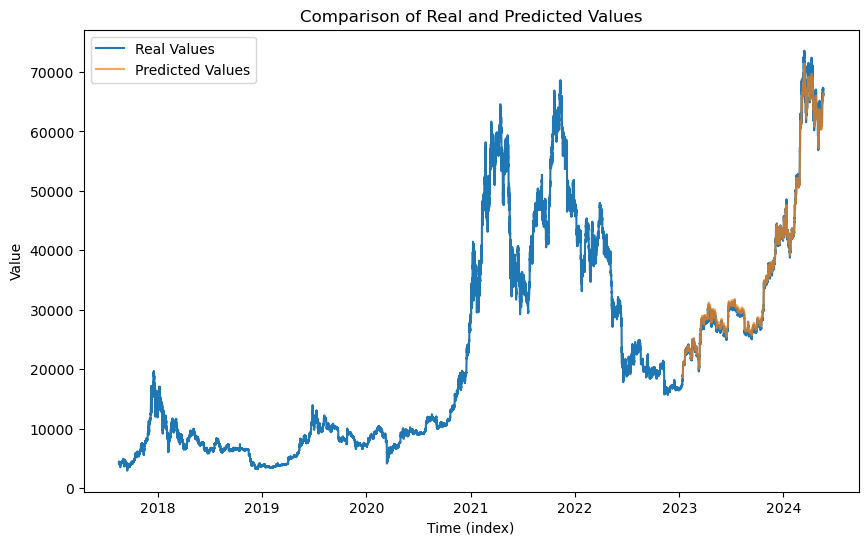

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(data, label='Real Values')
plt.plot(predicted_prices[0], label='Predicted Values', alpha=0.7)
plt.title('Comparison of Real and Predicted Values')
plt.xlabel('Time (index)')
plt.ylabel('Value')
plt.legend()
plt.show()

In [ ]:
data

,close
date,
2017-08-17 04:00:00,4308.830
2017-08-17 05:00:00,4315.320
2017-08-17 06:00:00,4324.350
2017-08-17 07:00:00,4349.990
2017-08-17 08:00:00,4360.690
...,...
2024-05-19 20:00:00,66163.990
2024-05-19 21:00:00,66280.000
2024-05-19 22:00:00,66363.610


In [ ]:
input_sequence = data['close'][-window_size:].values.reshape(1, -1)
input_sequence_scaled = scaler.transform(input_sequence)

predictions = []
for _ in range(30):  # Predice 30 valores futuros
    # Reshape del input para que coincida con la entrada del modelo (1, window_size, 1)
    reshaped_input = np.reshape(input_sequence_scaled, (1, window_size, 1))
    # Predecir el siguiente valor
    predicted_value = model.predict(reshaped_input)
    predictions.append(predicted_value[0][0])
    # Añadir la predicción al input para la siguiente iteración
    input_sequence_scaled = np.append(input_sequence_scaled[:, 1:], predicted_value, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━

In [ ]:
predictions

[65912.086,
 73183.51,
 73464.37,
 73434.984,
 73247.86,
 73105.08,
 72967.67,
 72838.82,
 72717.41,
 72603.15,
 72472.42,
 72348.6,
 72263.79,
 72191.93,
 72132.836,
 72084.74,
 72046.17,
 72015.39,
 71990.875,
 71971.43,
 71955.91,
 71943.49,
 71933.55,
 71925.65,
 71919.414,
 71914.484,
 71910.586,
 71907.42,
 71902.19,
 71831.664]

In [21]:
from sklearn.preprocessing import MinMaxScaler

train_features = features[:]
train_labels = labels[:]

# Normalizar los datos
scaler = MinMaxScaler(feature_range=(0, 1))
train_features_scaled = scaler.fit_transform(train_features)  # Ajustar y transformar los datos de entrenamiento

# Reshape features para el modelo LSTM (muestras, pasos de tiempo, características)
train_features = np.reshape(train_features_scaled, (train_features_scaled.shape[0], train_features_scaled.shape[1], 1))

#entrenamos el codigo con todos los datos

model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(window_size, 1)),
    Dropout(0.2),
    BatchNormalization(),
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    BatchNormalization(),
    LSTM(50),
    Dropout(0.2),
    BatchNormalization(),
    Dense(25, activation='relu'),
    Dense(1)
])

optimizer = Adam(learning_rate= 0.001)

# Compilar el modelo
model.compile(optimizer = optimizer, loss='mean_squared_error')

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)

history = model.fit(
    train_features, train_labels,
    epochs=100,
    batch_size=32,
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr],
    verbose=2
)

Epoch 1/100


c:\Users\germa\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1665/1665 - 42s - 25ms/step - loss: 412453856.0000 - val_loss: 101246144.0000 - learning_rate: 0.0010
Epoch 2/100
1665/1665 - 36s - 22ms/step - loss: 18771384.0000 - val_loss: 5393859.0000 - learning_rate: 0.0010
Epoch 3/100
1665/1665 - 35s - 21ms/step - loss: 10044881.0000 - val_loss: 44868916.0000 - learning_rate: 0.0010
Epoch 4/100
1665/1665 - 35s - 21ms/step - loss: 7983505.5000 - val_loss: 7478064.5000 - learning_rate: 0.0010
Epoch 5/100
1665/1665 - 36s - 21ms/step - loss: 6323850.5000 - val_loss: 1608473.8750 - learning_rate: 0.0010
Epoch 6/100
1665/1665 - 36s - 22ms/step - loss: 5350817.5000 - val_loss: 5457856.5000 - learning_rate: 0.0010
Epoch 7/100
1665/1665 - 36s - 22ms/step - loss: 4256475.5000 - val_loss: 4768431.5000 - learning_rate: 0.0010
Epoch 8/100
1665/1665 - 36s - 21ms/step - loss: 3613806.5000 - val_loss: 2568465.0000 - learning_rate: 0.0010
Epoch 9/100
1665/1665 - 36s - 22ms/step - loss: 3513918.5000 - val_loss: 2787183.7500 - learning_rate: 0.0010
Epoch 10/100
16

In [22]:
import joblib

In [23]:
joblib.dump(model, 'model.pkl')

['model.pkl']

In [32]:
import numpy as np

# Función para hacer predicciones múltiples
def predict_next_30_values(model, data, window_size, scaler):
    # Tomar los últimos 'window_size' puntos de los datos como punto de partida
    input_sequence = data['close'][-window_size:].values.reshape(1, -1)
    input_sequence_scaled = scaler.transform(input_sequence)

    predictions = []
    for _ in range(30):  # Predice 30 valores futuros
        # Reshape del input para que coincida con la entrada del modelo (1, window_size, 1)
        reshaped_input = np.reshape(input_sequence_scaled, (1, window_size, 1))
        # Predecir el siguiente valor
        predicted_value = model.predict(reshaped_input)
        predictions.append(predicted_value[0][0])
        # Añadir la predicción al input para la siguiente iteración
        input_sequence_scaled = np.append(input_sequence_scaled[:, 1:], predicted_value, axis=1)
    
    # Transformar los valores predichos a la escala original
    return predictions

# Datos de cierre del bitcoin (suponiendo que 'data' es un DataFrame con los precios de cierre)
predictions = predict_next_30_values(model, data, window_size, scaler)
print("Predicciones de los próximos 30 horas:", predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

In [33]:
date_range = pd.date_range(start=data.index.max(), periods=30, freq='H')

In [29]:
date_range

DatetimeIndex(['2024-05-20 00:00:00', '2024-05-20 01:00:00',
               '2024-05-20 02:00:00', '2024-05-20 03:00:00',
               '2024-05-20 04:00:00', '2024-05-20 05:00:00',
               '2024-05-20 06:00:00', '2024-05-20 07:00:00',
               '2024-05-20 08:00:00', '2024-05-20 09:00:00',
               '2024-05-20 10:00:00', '2024-05-20 11:00:00',
               '2024-05-20 12:00:00', '2024-05-20 13:00:00',
               '2024-05-20 14:00:00', '2024-05-20 15:00:00',
               '2024-05-20 16:00:00', '2024-05-20 17:00:00',
               '2024-05-20 18:00:00', '2024-05-20 19:00:00',
               '2024-05-20 20:00:00', '2024-05-20 21:00:00',
               '2024-05-20 22:00:00', '2024-05-20 23:00:00',
               '2024-05-21 00:00:00', '2024-05-21 01:00:00',
               '2024-05-21 02:00:00', '2024-05-21 03:00:00',
               '2024-05-21 04:00:00', '2024-05-21 05:00:00'],
              dtype='datetime64[ns]', freq='H')

In [34]:
predictions = pd.DataFrame(data=predictions, index=date_range)

In [35]:
predictions

,0
2024-05-20 00:00:00,66212.664
2024-05-20 01:00:00,68538.320
2024-05-20 02:00:00,69786.977
2024-05-20 03:00:00,70490.125
2024-05-20 04:00:00,70926.250
2024-05-20 05:00:00,71210.930
2024-05-20 06:00:00,71414.617
2024-05-20 07:00:00,71569.836
2024-05-20 08:00:00,71691.547
2024-05-20 09:00:00,71791.555


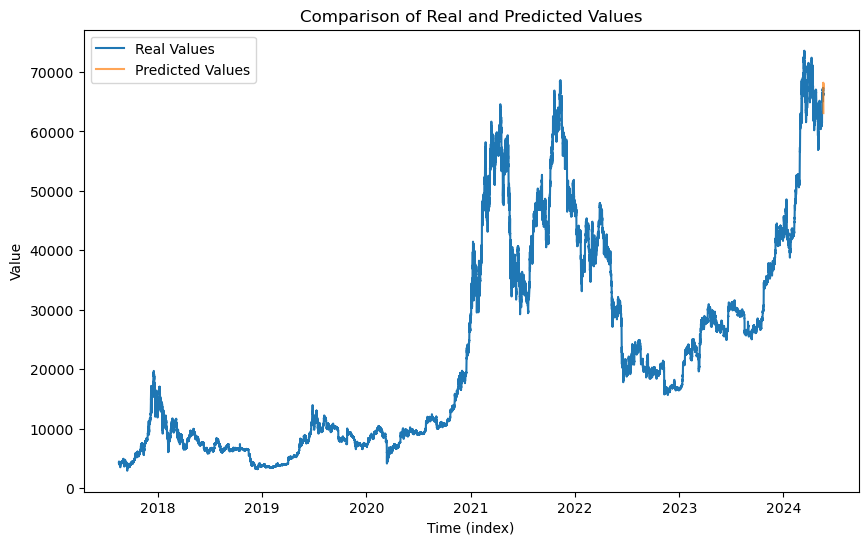

In [89]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(data["close"], label='Real Values')
plt.plot(predictions, label='Predicted Values', alpha=0.7)
plt.title('Comparison of Real and Predicted Values')
plt.xlabel('Time (index)')
plt.ylabel('Value')
plt.legend()
plt.show()

In [90]:
import yaml

def read_config(file_path):
    with open(file_path, 'r') as file:
        config = yaml.safe_load(file)
    return config

# Ruta al archivo config.yaml
config_file_path = 'config.yaml'

# Leer el archivo de configuración
config = read_config(config_file_path)

# Acceder a los valores del archivo YAML
data_url = config['data']


In [91]:
data_url

'https://drive.google.com/uc?export=download&id=1a5vXnlVYJtP8fvb6VxcPFZ2uCZy1QJef'

In [36]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 60, 50)         │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 60, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 60, 50)         │           200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 60, 50)         │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 60, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 60, 50)         │           200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 50)             │           200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 25)             │         1,275 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 157,505 (615.26 KB)

 Trainable params: 52,401 (204.69 KB)

 Non-trainable params: 300 (1.17 KB)

 Optimizer params: 104,804 (409.39 KB)